In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [53]:
# 1. 데이터 로드
mel_df = pd.read_csv('./data/melb_data.csv')
mel_df

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,26/08/2017,16.7,3150.0,...,2.0,2.0,652.0,NaN,1981.0,NaN,-37.90562,145.16761,South-Eastern Metropolitan,7392.0
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,26/08/2017,6.8,3016.0,...,2.0,2.0,333.0,133.0,1995.0,NaN,-37.85927,144.87904,Western Metropolitan,6380.0
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,26/08/2017,6.8,3016.0,...,2.0,4.0,436.0,NaN,1997.0,NaN,-37.85274,144.88738,Western Metropolitan,6380.0
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,26/08/2017,6.8,3016.0,...,1.0,5.0,866.0,157.0,1920.0,NaN,-37.85908,144.89299,Western Metropolitan,6380.0


In [54]:
# 2. 데이터 구조 및 기초 통계 확인
mel_df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [55]:
mel_df.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')

In [56]:
mel_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

In [57]:
mel_df.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


In [58]:
mel_df.keys()

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')

In [59]:
# 3. 결측치 및 이상치 탐색
# - 결측치 탐색
mel_df.isnull().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                62
Landsize            0
BuildingArea     6450
YearBuilt        5375
CouncilArea      1369
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64

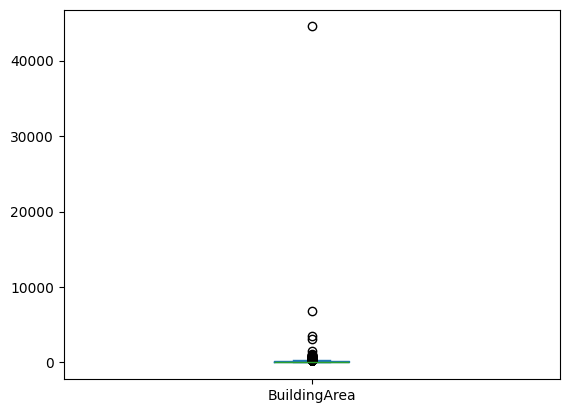

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
181,Altona,5/57 Blyth St,3,u,730000.0,SP,Barlow,28/05/2016,13.8,3018.0,...,2.0,1.0,70.0,3.0,2014.0,Hobsons Bay,-37.86800,144.82850,Western Metropolitan,5301.0
274,Armadale,3/769 High St,3,t,1101000.0,S,Jellis,27/11/2016,6.3,3143.0,...,1.0,2.0,103.0,3.0,2000.0,Stonnington,-37.85420,145.01350,Southern Metropolitan,4836.0
663,Balwyn North,1 Morris St,6,h,1900000.0,VB,hockingstuart,22/05/2016,9.2,3104.0,...,1.0,6.0,691.0,5.0,NaN,Boroondara,-37.80220,145.07750,Southern Metropolitan,7809.0
984,Box Hill,3/14 Bedford St,3,t,750000.0,S,Jellis,15/10/2016,13.1,3128.0,...,2.0,1.0,150.0,3.0,2000.0,Whitehorse,-37.82870,145.13190,Eastern Metropolitan,4605.0
1138,Brighton,147A Male St,2,t,1037000.0,S,Buxton,25/02/2017,11.2,3186.0,...,1.0,2.0,125.0,2.0,2009.0,Bayside,-37.90780,145.00510,Southern Metropolitan,10579.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13434,Glen Iris,6 Viva St,4,h,2690000.0,PI,Marshall,26/08/2017,7.3,3146.0,...,2.0,2.0,647.0,0.0,1910.0,NaN,-37.86133,145.04167,Southern Metropolitan,10412.0
13468,Kew,16 Hodgson St,5,h,3450000.0,PI,Kay,26/08/2017,5.4,3101.0,...,2.0,2.0,668.0,0.0,2006.0,NaN,-37.80795,145.01474,Southern Metropolitan,10331.0
13472,Kilsyth,17 Birkenhead Dr,3,h,803000.0,S,Max,26/08/2017,26.0,3137.0,...,1.0,2.0,862.0,0.0,1970.0,NaN,-37.79902,145.32092,Eastern Metropolitan,4654.0
13499,Moorabbin,7 Walsh Av,3,h,1290000.0,S,Ray,26/08/2017,14.3,3189.0,...,1.0,1.0,580.0,0.0,1970.0,NaN,-37.94492,145.04938,Southern Metropolitan,2555.0


In [60]:
# - 이상치 탐색
mel_df['BuildingArea'].plot(kind='box')
plt.show()

mel_df[mel_df['BuildingArea'] < 10]

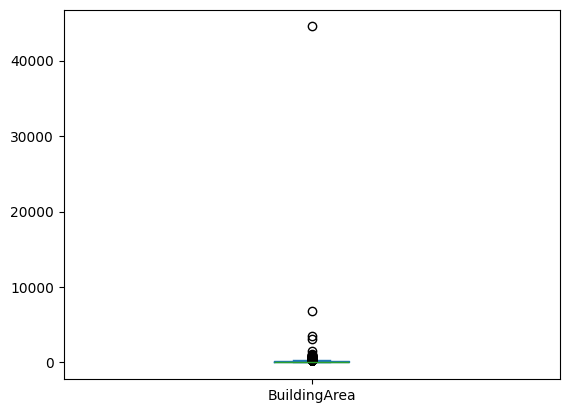

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
181,Altona,5/57 Blyth St,3,u,730000.0,SP,Barlow,28/05/2016,13.8,3018.0,...,2.0,1.0,70.0,3.0,2014.0,Hobsons Bay,-37.86800,144.82850,Western Metropolitan,5301.0
274,Armadale,3/769 High St,3,t,1101000.0,S,Jellis,27/11/2016,6.3,3143.0,...,1.0,2.0,103.0,3.0,2000.0,Stonnington,-37.85420,145.01350,Southern Metropolitan,4836.0
663,Balwyn North,1 Morris St,6,h,1900000.0,VB,hockingstuart,22/05/2016,9.2,3104.0,...,1.0,6.0,691.0,5.0,NaN,Boroondara,-37.80220,145.07750,Southern Metropolitan,7809.0
984,Box Hill,3/14 Bedford St,3,t,750000.0,S,Jellis,15/10/2016,13.1,3128.0,...,2.0,1.0,150.0,3.0,2000.0,Whitehorse,-37.82870,145.13190,Eastern Metropolitan,4605.0
1138,Brighton,147A Male St,2,t,1037000.0,S,Buxton,25/02/2017,11.2,3186.0,...,1.0,2.0,125.0,2.0,2009.0,Bayside,-37.90780,145.00510,Southern Metropolitan,10579.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13434,Glen Iris,6 Viva St,4,h,2690000.0,PI,Marshall,26/08/2017,7.3,3146.0,...,2.0,2.0,647.0,0.0,1910.0,NaN,-37.86133,145.04167,Southern Metropolitan,10412.0
13468,Kew,16 Hodgson St,5,h,3450000.0,PI,Kay,26/08/2017,5.4,3101.0,...,2.0,2.0,668.0,0.0,2006.0,NaN,-37.80795,145.01474,Southern Metropolitan,10331.0
13472,Kilsyth,17 Birkenhead Dr,3,h,803000.0,S,Max,26/08/2017,26.0,3137.0,...,1.0,2.0,862.0,0.0,1970.0,NaN,-37.79902,145.32092,Eastern Metropolitan,4654.0
13499,Moorabbin,7 Walsh Av,3,h,1290000.0,S,Ray,26/08/2017,14.3,3189.0,...,1.0,1.0,580.0,0.0,1970.0,NaN,-37.94492,145.04938,Southern Metropolitan,2555.0


In [61]:
mel_df['BuildingArea'].plot(kind='box')
plt.show()

mel_df[mel_df['BuildingArea'] < 10]

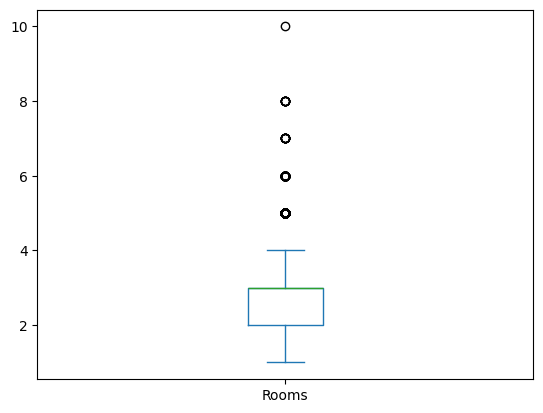

In [62]:
mel_df['Rooms'].plot(kind='box')
plt.show()

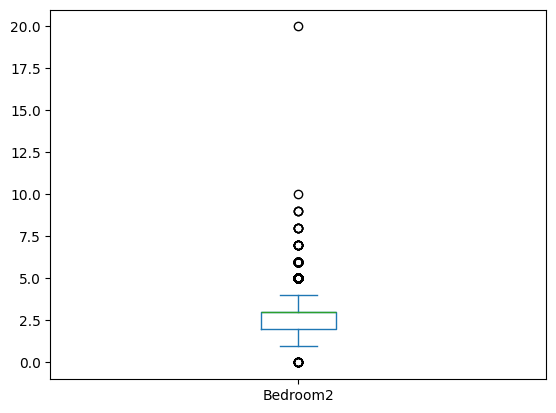

In [63]:
mel_df['Bedroom2'].plot(kind='box')
plt.show()

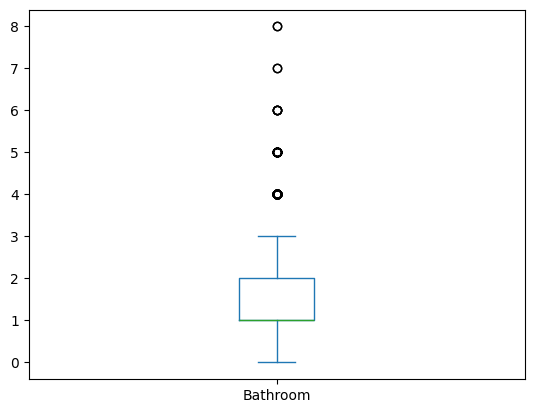

In [64]:
mel_df['Bathroom'].plot(kind='box')
plt.show()

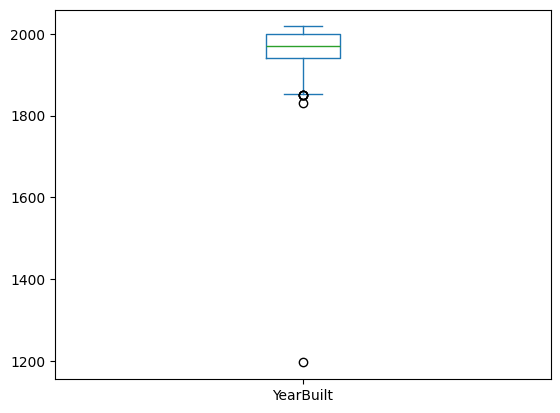

In [65]:
mel_df['YearBuilt'].plot(kind='box')
plt.show()

In [66]:
mel_df['Car'].unique()

array([ 1.,  0.,  2.,  6.,  5.,  4.,  3.,  8.,  7.,  9., 10., nan])

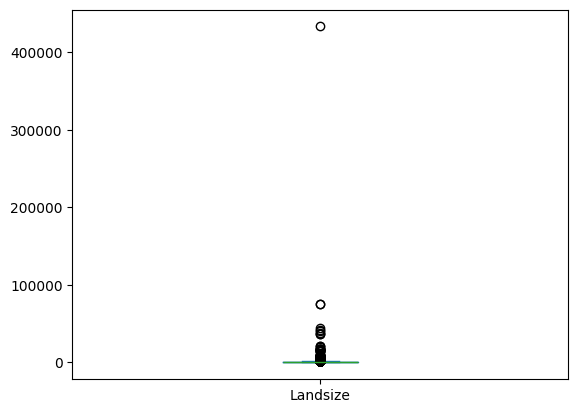

In [67]:
mel_df['Landsize'].plot(kind='box')
plt.show()

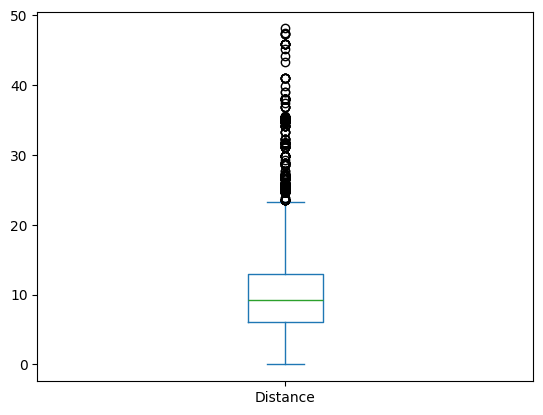

In [68]:
mel_df['Distance'].plot(kind='box')
plt.show()

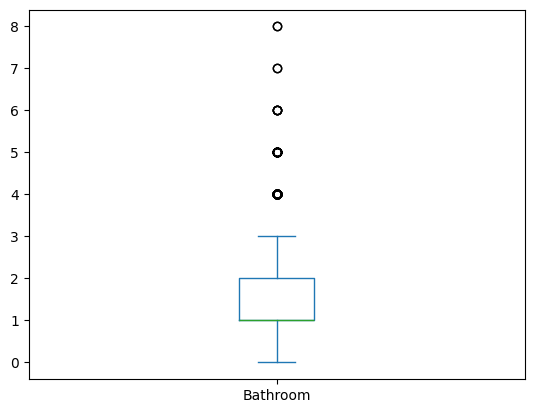

In [69]:
mel_df['Bathroom'].plot(kind='box')
plt.show()

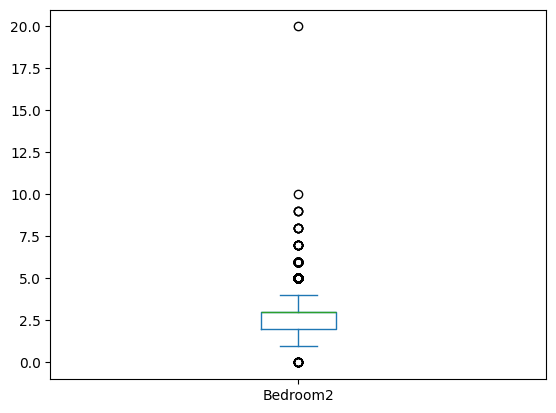

In [70]:
mel_df['Bedroom2'].plot(kind='box')
plt.show()

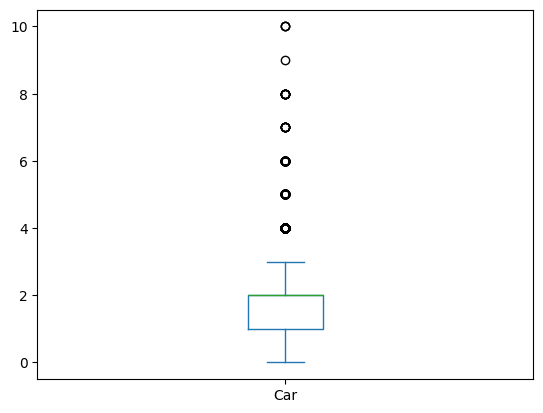

In [71]:
mel_df['Car'].plot(kind='box')
plt.show()

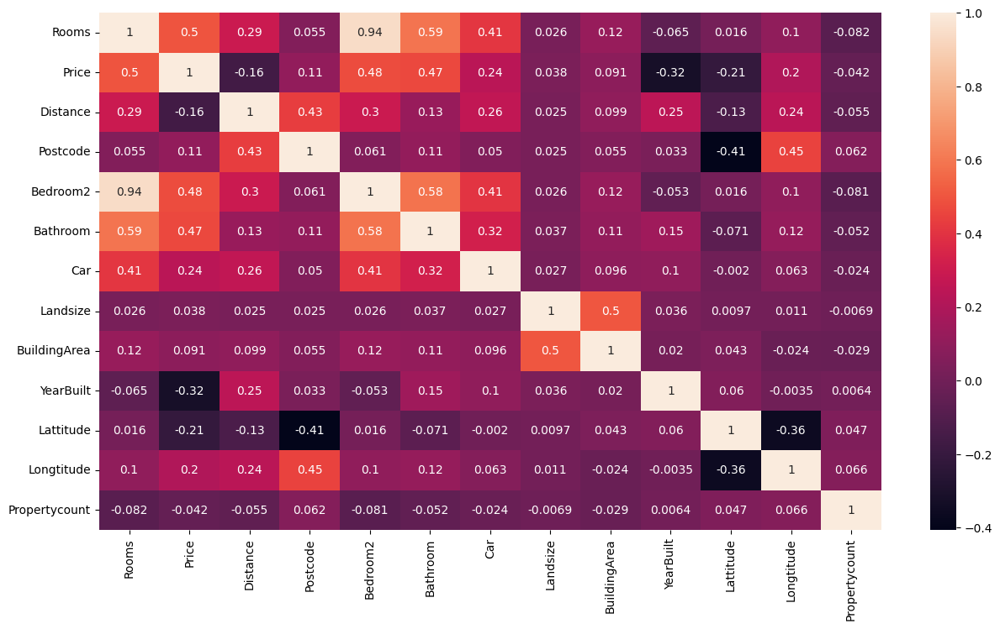

In [72]:
corr_matrix = mel_df.corr(numeric_only=True)
corr_matrix

plt.figure(figsize=(15,8))
sns.heatmap(corr_matrix, annot=True)
plt.show()

In [73]:
# 결측치 열 제거
mel_df_cleaned = mel_df.dropna(subset=['BuildingArea', 'YearBuilt'],axis=0)
mel_df_cleaned = mel_df_cleaned.drop(['CouncilArea'], axis=1)
mel_df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6858 entries, 1 to 13579
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         6858 non-null   object 
 1   Address        6858 non-null   object 
 2   Rooms          6858 non-null   int64  
 3   Type           6858 non-null   object 
 4   Price          6858 non-null   float64
 5   Method         6858 non-null   object 
 6   SellerG        6858 non-null   object 
 7   Date           6858 non-null   object 
 8   Distance       6858 non-null   float64
 9   Postcode       6858 non-null   float64
 10  Bedroom2       6858 non-null   float64
 11  Bathroom       6858 non-null   float64
 12  Car            6830 non-null   float64
 13  Landsize       6858 non-null   float64
 14  BuildingArea   6858 non-null   float64
 15  YearBuilt      6858 non-null   float64
 16  Lattitude      6858 non-null   float64
 17  Longtitude     6858 non-null   float64
 18  Regionname  

In [74]:
# 데이터 전처리
# 'Car'열에 포함된 nan값을 평균값으로 대체
car_mean = mel_df_cleaned['Car'].mean()
mel_df_cleaned['Car'].fillna(car_mean,inplace=True)

mel_df_cleaned['Car'].unique()

C:\Users\Playdata\AppData\Local\Temp\ipykernel_12272\1557602306.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  mel_df_cleaned['Car'].fillna(car_mean,inplace=True)


array([ 0.        ,  2.        ,  1.        ,  6.        ,  5.        ,
        4.        ,  3.        ,  7.        ,  8.        ,  9.        ,
       10.        ,  1.60688141])

In [75]:
mel_df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6858 entries, 1 to 13579
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         6858 non-null   object 
 1   Address        6858 non-null   object 
 2   Rooms          6858 non-null   int64  
 3   Type           6858 non-null   object 
 4   Price          6858 non-null   float64
 5   Method         6858 non-null   object 
 6   SellerG        6858 non-null   object 
 7   Date           6858 non-null   object 
 8   Distance       6858 non-null   float64
 9   Postcode       6858 non-null   float64
 10  Bedroom2       6858 non-null   float64
 11  Bathroom       6858 non-null   float64
 12  Car            6858 non-null   float64
 13  Landsize       6858 non-null   float64
 14  BuildingArea   6858 non-null   float64
 15  YearBuilt      6858 non-null   float64
 16  Lattitude      6858 non-null   float64
 17  Longtitude     6858 non-null   float64
 18  Regionname  

In [93]:
mel_df_cleaned_notnumeric = mel_df_cleaned.drop(['Suburb', 'Address', 'Type', 'Method', 'SellerG', 'Date', 'Regionname'], axis=1)
mel_df_cleaned_notnumeric

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
1,2,1035000.0,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,-37.80790,144.99340,4019.0
2,3,1465000.0,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,-37.80930,144.99440,4019.0
4,4,1600000.0,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,-37.80720,144.99410,4019.0
6,3,1876000.0,2.5,3067.0,4.0,2.0,0.0,245.0,210.0,1910.0,-37.80240,144.99930,4019.0
7,2,1636000.0,2.5,3067.0,2.0,1.0,2.0,256.0,107.0,1890.0,-37.80600,144.99540,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13572,2,650000.0,14.5,3087.0,2.0,1.0,1.0,210.0,79.0,2006.0,-37.70657,145.07878,2329.0
13573,4,635000.0,14.7,3030.0,4.0,2.0,1.0,662.0,172.0,1980.0,-37.89327,144.64789,16166.0
13576,3,1031000.0,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,-37.85927,144.87904,6380.0
13578,4,2500000.0,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,-37.85908,144.89299,6380.0


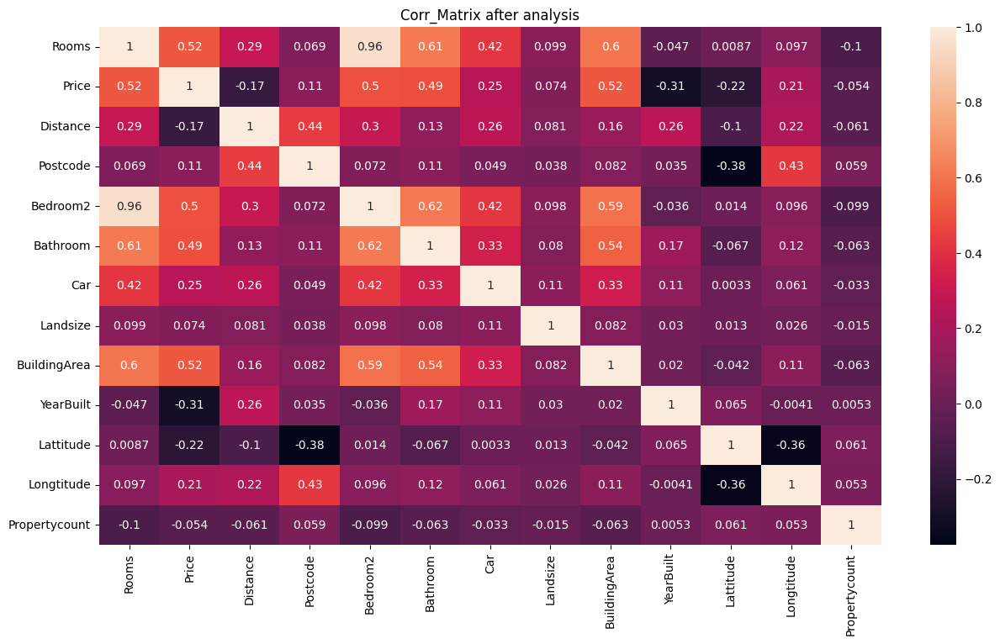

In [95]:
# corr_matrix = mel_df.corr(numeric_only=True)
# corr_matrix = mel_df_cleaned.corr(numeric_only=True)
corr_matrix = mel_df_cleaned_notnumeric.corr(numeric_only=True)

plt.figure(figsize=(15,8))
sns.heatmap(corr_matrix, annot=True)
plt.title('Corr_Matrix after analysis')
plt.show()

In [96]:
corr_matrix['Price']
corr_matrix['Price'].sort_values(ascending=False)

Price            1.000000
BuildingArea     0.519284
Rooms            0.516664
Bedroom2         0.499531
Bathroom         0.491652
Car              0.250467
Longtitude       0.209356
Postcode         0.110401
Landsize         0.073576
Propertycount   -0.054202
Distance        -0.166493
Lattitude       -0.217326
YearBuilt       -0.309277
Name: Price, dtype: float64

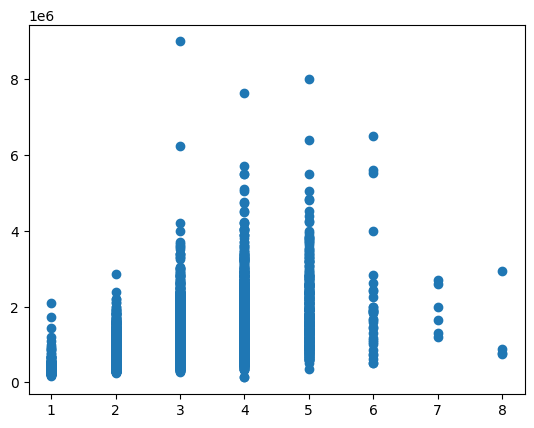

In [77]:
# 4. 데이터 시각화
# - Price에 대한 각 컬럼들에 대한 시각화

x=mel_df_cleaned['Rooms']
y = mel_df_cleaned['Price']

plt.scatter(x,y)
plt.show()

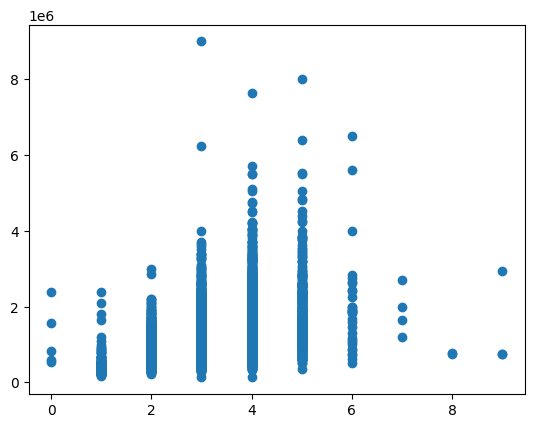

In [78]:
x=mel_df_cleaned['Bedroom2']
y = mel_df_cleaned['Price']

plt.scatter(x,y)
plt.show()

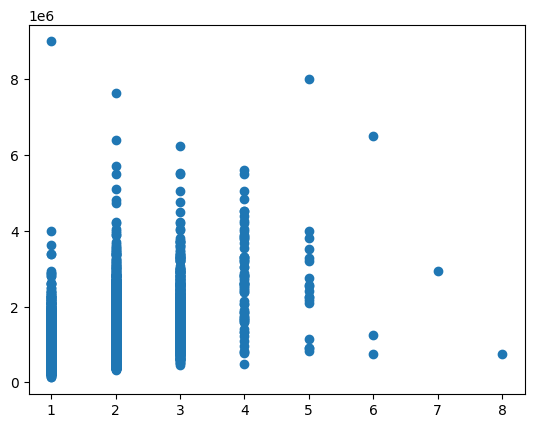

In [79]:
x=mel_df_cleaned['Bathroom']
y = mel_df_cleaned['Price']

plt.scatter(x,y)
plt.show()

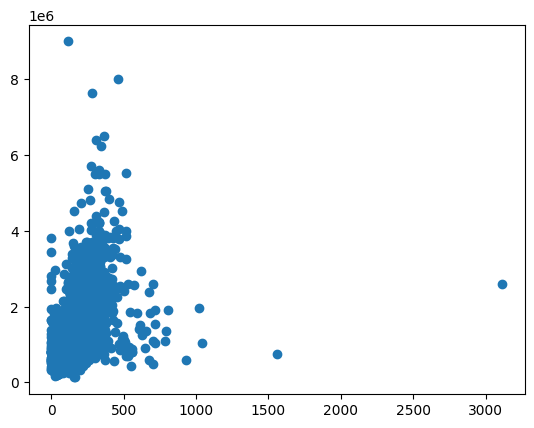

In [80]:
x = mel_df_cleaned['BuildingArea']
y = mel_df_cleaned['Price']

plt.scatter(x,y)
plt.show()

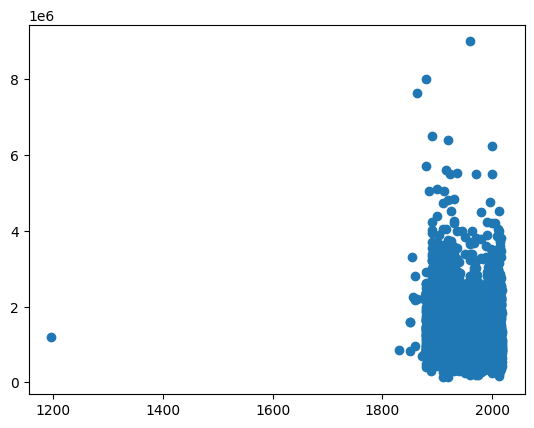

In [97]:
x = mel_df_cleaned['YearBuilt']
y = mel_df_cleaned['Price']

plt.scatter(x,y)
plt.show()

In [81]:
mean_landsize = mel_df['Landsize'][mel_df['Landsize']> 0].mean()

mel_df.loc[mel_df['Landsize']==0, 'Landsize'] = mean_landsize


In [82]:
import folium
map = folium.Map(location = [-37.8, 145], zoom_control=True)

for i in mel_df.index:
    folium.Circle(
        location=mel_df.loc[i,['Lattitude', 'Longtitude']].tolist(),
        tooltip=None,
        radius=100
        # radius=mel_df.loc[i,'Landsize']
    ).add_to(map)

map

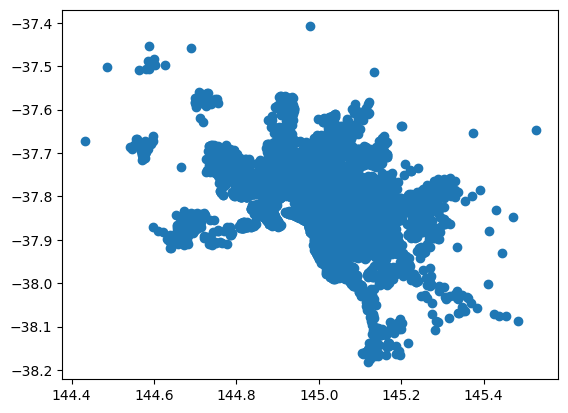

In [83]:
plt.scatter(mel_df['Longtitude'], mel_df['Lattitude'])
plt.show()

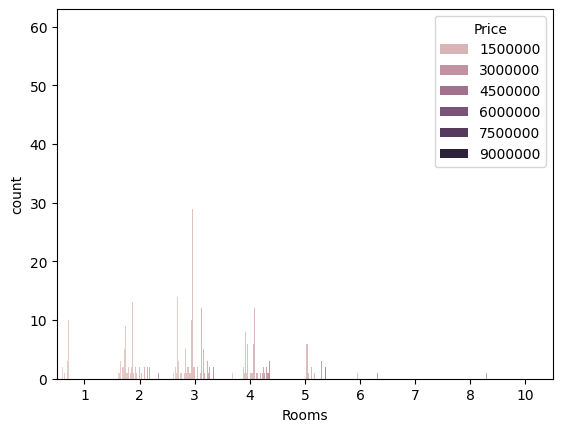

In [84]:
sns.countplot(data=mel_df, x='Rooms', hue='Price')
plt.show()

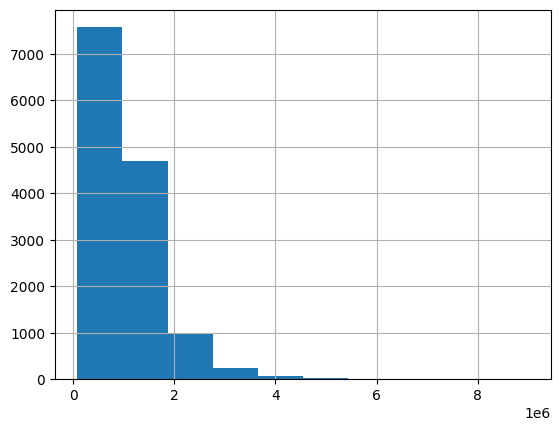

In [85]:
mel_df['Price'].hist()
plt.show()